# Grid-based Dijkstra
<a href="https://colab.research.google.com/github/LinkHS/Colab/blob/master/Self-driving/PathPlanning/Grid-based Dijkstra.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

References:
- [Introduction to the A* Algorithm](https://www.redblobgames.com/pathfinding/a-star/introduction.html)
- (Tool) [PathFinding](http://qiao.github.io/PathFinding.js/visual)
- [常用规划算法解析1-图搜索篇](https://zhuanlan.zhihu.com/p/362348533)

In [2]:
#!pip install jdc

In [3]:
import jdc
import matplotlib.pyplot as plt
import math

from IPython import display
show_animation = True

class Animator:
  def __init__(self):
    self.pos_x = []
    self.pos_y = []

  def add_pos(self, x, y):
    self.pos_x.append(x)
    self.pos_y.append(y)

g_animator = Animator()

初始化地图信息，包括障碍物位置、网格大小（resolution）、车辆大小（robot radius）等：

In [4]:
class Dijkstra:
  def __init__(self, ox, oy, resolution, robot_radius):
    """Initialize map for a star planning
    @ox: x position list of Obstacles [m]
    @oy: y position list of Obstacles [m]
    @resolution: grid resolution [m]
    @robot_radius: robot radius [m]
    """
    self.min_x = None
    self.min_y = None
    self.max_x = None
    self.max_y = None
    self.x_width = None
    self.y_width = None
    self.obstacle_map = None

    self.resolution = resolution
    self.robot_radius = robot_radius
    self.calc_obstacle_map(ox, oy)
    self.motion = self.get_motion_model()

一个节点包括自身坐标（x,y）、权重（cost）、父节点等：

In [5]:
class Node:
  def __init__(self, x, y, cost, parent_index):
    self.x = x  # index of grid
    self.y = y  # index of grid
    self.cost = cost
    self.parent_index = parent_index  # index of previous Node

  def __str__(self):
    return str(self.x) + "," + str(self.y) + "," + str(
        self.cost) + "," + str(self.parent_index)

In [6]:
%%add_to Dijkstra
def planning(self, sx, sy, gx, gy):
  """dijkstra path search
  input:
    @s_x: start x position [m]
    @s_y: start y position [m]
    @gx: goal x position [m]
    @gx: goal x position [m]
  return:
    @rx: x position list of the final path
    @ry: y position list of the final path
  """
  start_node = Node(self.calc_xy_index(sx, self.min_x),
               self.calc_xy_index(sy, self.min_y), 0.0, -1)
  goal_node = Node(self.calc_xy_index(gx, self.min_x),
              self.calc_xy_index(gy, self.min_y), 0.0, -1)

  open_set, closed_set = dict(), dict()
  open_set[self.calc_index(start_node)] = start_node
  while 1:
    c_id = min(open_set, key=lambda o: open_set[o].cost)
    current = open_set[c_id]

    # show graph
    if show_animation:  # pragma: no cover
      # plt.plot(self.calc_position(current.x, self.min_x),
      #      self.calc_position(current.y, self.min_y), "xc")
      g_animator.add_pos(self.calc_position(current.x, self.min_x),
                self.calc_position(current.y, self.min_y))

    if current.x == goal_node.x and current.y == goal_node.y:
      print("Find goal")
      goal_node.parent_index = current.parent_index
      goal_node.cost = current.cost
      break

    # Remove the item from the open set
    del open_set[c_id]

    # Add it to the closed set
    closed_set[c_id] = current

    # expand search grid based on motion model
    for move_x, move_y, move_cost in self.motion:
      node = Node(current.x + move_x,
             current.y + move_y,
             current.cost + move_cost, c_id)
      n_id = self.calc_index(node)
      if n_id in closed_set:
        continue
      if not self.verify_node(node):
        continue
      if n_id not in open_set:
        open_set[n_id] = node  # Discover a new node
      else:
        if open_set[n_id].cost >= node.cost:
          # This path is the best until now. record it!
          open_set[n_id] = node
  rx, ry = self.calc_final_path(goal_node, closed_set)
  return rx, ry

In [7]:
%%add_to Dijkstra
def calc_final_path(self, goal_node, closed_set):
  # generate final course
  rx = [self.calc_position(goal_node.x, self.min_x)]
  ry = [self.calc_position(goal_node.y, self.min_y)]
  parent_index = goal_node.parent_index
  while parent_index != -1:
    n = closed_set[parent_index]
    rx.append(self.calc_position(n.x, self.min_x))
    ry.append(self.calc_position(n.y, self.min_y))
    parent_index = n.parent_index
  return rx, ry

def calc_position(self, index, minp):
  pos = index*self.resolution + minp
  return pos

def calc_xy_index(self, position, minp):
  return round((position - minp) / self.resolution)

def calc_index(self, node):
  return (node.y - self.min_y) * self.x_width + (node.x - self.min_x)

In [8]:
%%add_to Dijkstra
def verify_node(self, node):
  px = self.calc_position(node.x, self.min_x)
  py = self.calc_position(node.y, self.min_y)
  if px < self.min_x:
    return False
  if py < self.min_y:
    return False
  if px >= self.max_x:
    return False
  if py >= self.max_y:
    return False

  if self.obstacle_map[node.x][node.y]:
    return False
  return True

In [9]:
%%add_to Dijkstra
def calc_obstacle_map(self, ox, oy):
  self.min_x = round(min(ox))
  self.min_y = round(min(oy))
  self.max_x = round(max(ox))
  self.max_y = round(max(oy))
  print("min_x:", self.min_x)
  print("min_y:", self.min_y)
  print("max_x:", self.max_x)
  print("max_y:", self.max_y)

  self.x_width = round((self.max_x - self.min_x) / self.resolution)
  self.y_width = round((self.max_y - self.min_y) / self.resolution)
  print("x_width:", self.x_width)
  print("y_width:", self.y_width)

  # obstacle map generation
  self.obstacle_map = [[False for _ in range(self.y_width)]
               for _ in range(self.x_width)]
  for ix in range(self.x_width):
    x = self.calc_position(ix, self.min_x)
    for iy in range(self.y_width):
      y = self.calc_position(iy, self.min_y)
      for iox, ioy in zip(ox, oy):
        d = math.hypot(iox - x, ioy - y)
        if d <= self.robot_radius:
          self.obstacle_map[ix][iy] = True
          break

In [10]:
%%add_to Dijkstra
@staticmethod
def get_motion_model():
  # dx, dy, cost
  motion = [[1, 0, 1],
        [0, 1, 1],
        [-1, 0, 1],
        [0, -1, 1],
        [-1, -1, math.sqrt(2)],
        [-1, 1, math.sqrt(2)],
        [1, -1, math.sqrt(2)],
        [1, 1, math.sqrt(2)]]

  return motion

In [11]:
def main():
  # start and goal position
  sx = -5.0  # [m]
  sy = -5.0  # [m]
  gx = 50.0  # [m]
  gy = 50.0  # [m]
  grid_size = 2.0  # [m]
  robot_radius = 1.0  # [m]

  # set obstacle positions
  ox, oy = [], []
  for i in range(-10, 60):
    ox.append(i)
    oy.append(-10.0)
  for i in range(-10, 60):
    ox.append(60.0)
    oy.append(i)
  for i in range(-10, 61):
    ox.append(i)
    oy.append(60.0)
  for i in range(-10, 61):
    ox.append(-10.0)
    oy.append(i)
  for i in range(-10, 40):
    ox.append(20.0)
    oy.append(i)
  for i in range(0, 40):
    ox.append(40.0)
    oy.append(60.0 - i)

  # if show_animation:  # pragma: no cover
  #   fig = plt.figure()
  #   plt.plot(ox, oy, ".k")
  #   plt.plot(sx, sy, "og")
  #   plt.plot(gx, gy, "xb")
  #   plt.grid(True)
  #   plt.axis("equal")
  #   display.display(fig)

  dijkstra = Dijkstra(ox, oy, grid_size, robot_radius)
  rx, ry = dijkstra.planning(sx, sy, gx, gy)

  # if show_animation:  # pragma: no cover
  #   plt.plot(rx, ry, "-r")
  #   display.display(fig)
  #   display.clear_output(wait=True)

In [12]:
main()

min_x: -10
min_y: -10
max_x: 60
max_y: 60
x_width: 35
y_width: 35
Find goal


In [53]:
from matplotlib import animation
from matplotlib import rc

# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')

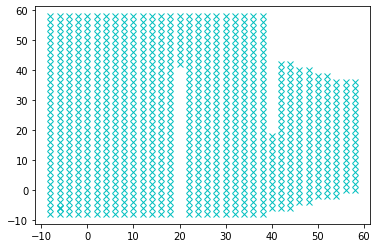

In [62]:
def draw(n):
  # global g_animator
  return plt.plot(g_animator.pos_x[n], g_animator.pos_y[n], "xc")

fig = plt.figure()
# blit=True re-draws only the parts that have changed.
anim = animation.FuncAnimation(fig, draw, frames=1000)
anim.save('BrowniamMotion.gif', writer="pillow", fps=10)

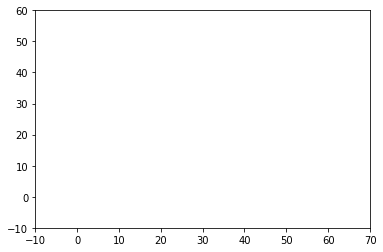

In [29]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
ax.set_xlim(-10, 70)
ax.set_ylim(-10, 60)
l, = ax.plot([1, 2], [1, 2], "xc")
g_animator.pos_x = np.array(g_animator.pos_x)
g_animator.pos_y = np.array(g_animator.pos_y)

animate = lambda i: l.set_data(g_animator.pos_x[:i], g_animator.pos_y[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=1000)

from IPython.display import HTML
HTML(ani.to_jshtml())

In [26]:
len(g_animator.pos_x)
g_animator.pos_x[:10]

array([-6., -4., -6., -8., -6., -8., -8., -4., -4., -2.])

In [4]:
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
l, = ax.plot([0,2*np.pi],[-1,1])

animate = lambda i: l.set_data(t[:i], x[:i])
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))
plt.show()

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/animation.py", line 1467, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


<IPython.core.display.Javascript object>